In [1]:
#importamos librerias utiles
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import cv2

#funcion auxiliar para mostrar un sample del data set
def muestraImagenes(imagen,alto,ancho,filas,columnas):
    plt.figure(figsize=(3.0 * columnas, 3.0 * filas))
    for i in range(columnas * filas):
        plt.subplot(filas, columnas, i + 1)
        plt.imshow(imagen[i].reshape((alto, ancho)), cmap='gray')
        plt.title('Famos@ %d' %i)
        plt.xticks(())
        plt.yticks(())

In [2]:
#leemos las imagenes en una lista
imagenes = [cv2.imread(file,-1) for file in glob.glob("famousFace/*.pgm")]

In [3]:
#pasamos la lista a un numpy array
imagenes = np.array(imagenes)
#mostramos el shape del array
imagenes.shape

(1071, 64, 64)

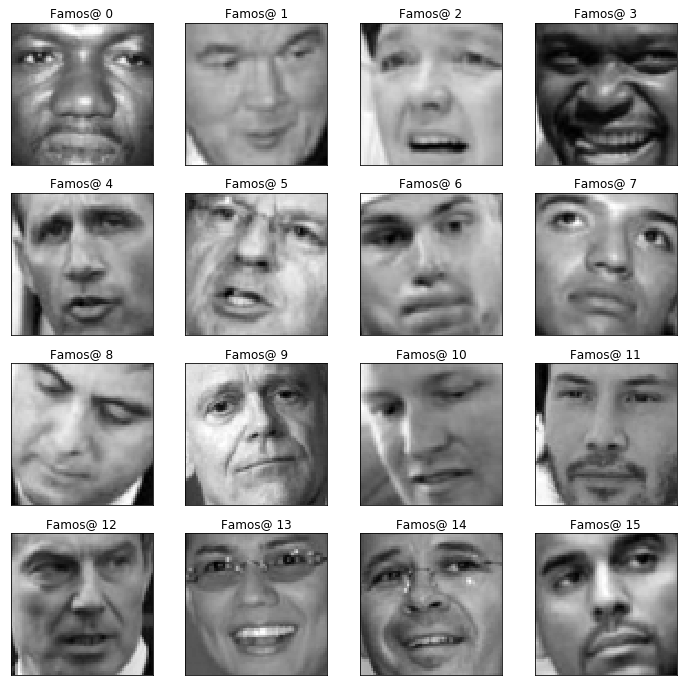

In [4]:
#mostramos 16 imagenes seleccionadas de manera random
z = np.random.randint(0, imagenes.shape[0],size=16)
muestraImagenes(imagenes[z],64,64,4,4)

El metodo a seguir se muestra en la siguiente imagen:
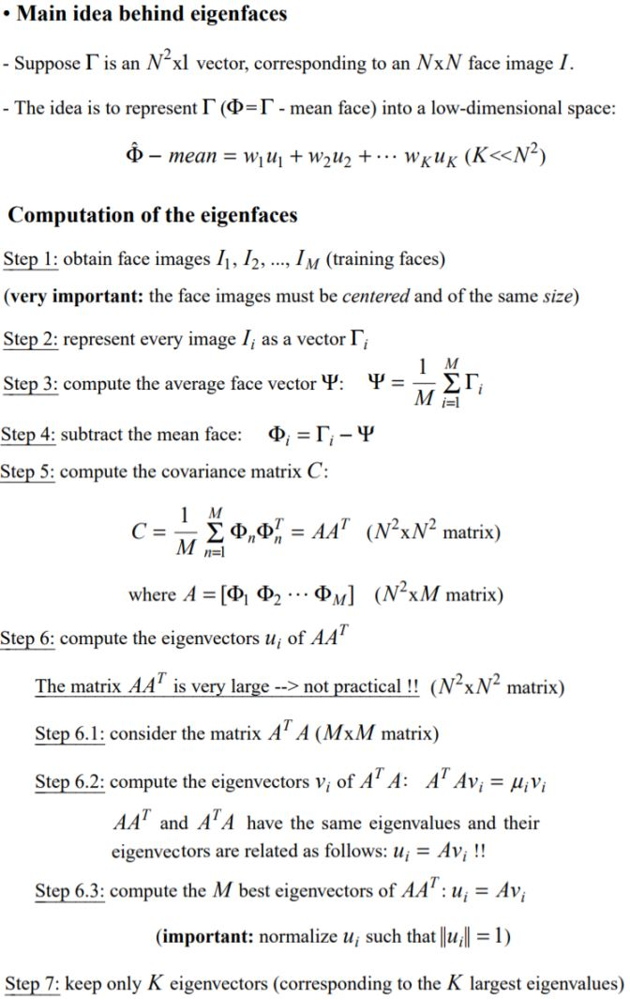
Tomado de: https://sandipanweb.wordpress.com/2018/01/06/eigenfaces-and-a-simple-face-detector-with-pca-svd-in-python/

In [5]:
def PCA(Datos,numcomponentes):
    #Convertimos cada imagen a un vector de N^2 x 1
    Gamma = imagenes.reshape(imagenes.shape[0],imagenes.shape[1]*imagenes.shape[2])
    #calculamos la media (step 3)
    Psi = np.mean(Gamma,axis=0)
    #calculamos phi
    Phi = Gamma - Psi
    #calculamos la SVD de Gamma (steps 4 to 7)
    U, Sigma, V = np.linalg.svd(Phi)
    componentes = V[:numcomponentes]
    proyeccion = U[:,:numcomponentes]*Sigma[:numcomponentes]
    return proyeccion, componentes, Psi, Phi

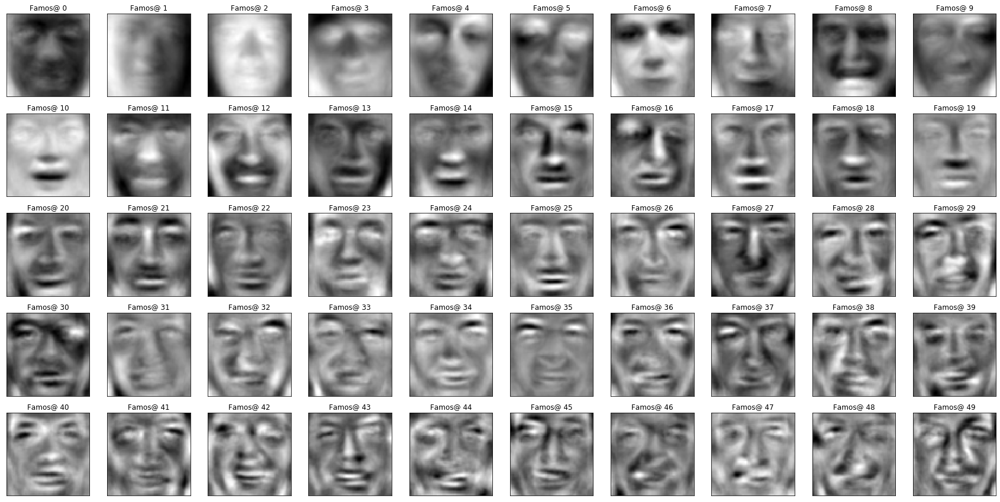

In [6]:
#hacemos una instancia de 50 componentes y las mostramos
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=50)
eigenFaces = componentes.reshape((50, imagenes.shape[1],imagenes.shape[2]))
muestraImagenes(eigenFaces, 64, 64, 5, 10) 

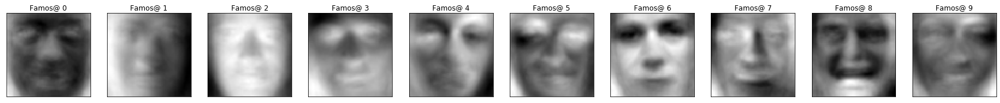

In [7]:
#hacemos una instancia de 10 componentes y las mostramos
#vemos que son lo mismo (es obvio ya que se toman los eigenvectores mas cartacteristicos)
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=10)
eigenFaces = componentes.reshape((10, imagenes.shape[1],imagenes.shape[2]))
muestraImagenes(eigenFaces, 64, 64, 1, 10) 

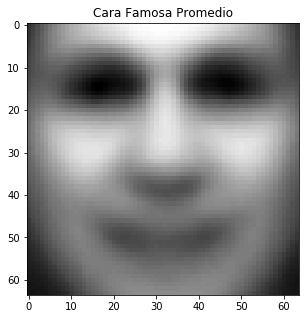

In [8]:
#mostamos la cara promedio de todo el data set
caraPromedio = psi.reshape((imagenes.shape[1],imagenes.shape[2]))
caraPromedio.shape
caraPromedio = caraPromedio.astype(np.uint8)
plt.figure(figsize=(5,5))
plt.title('Cara Famosa Promedio')
plt.imshow(caraPromedio, cmap = 'gray')
plt.show()

In [9]:
#definimos funcion que reconstruye una cara usando los eigenvectores y eigenvalores(svd matrix)
#basado en https://www.cs.toronto.edu/~guerzhoy/320/lec/pca.pdf
def reconstruye(phi, componentes, media, alto, ancho, indice):
    numeroFotos, tamanoFotocuadrado = phi.shape
    pesos = np.dot(phi, componentes.T)
    vectorCentrado=np.dot(pesos[indice, :], componentes)
    imagenReshapeada=(media+vectorCentrado).reshape(alto, ancho)
    return imagenReshapeada

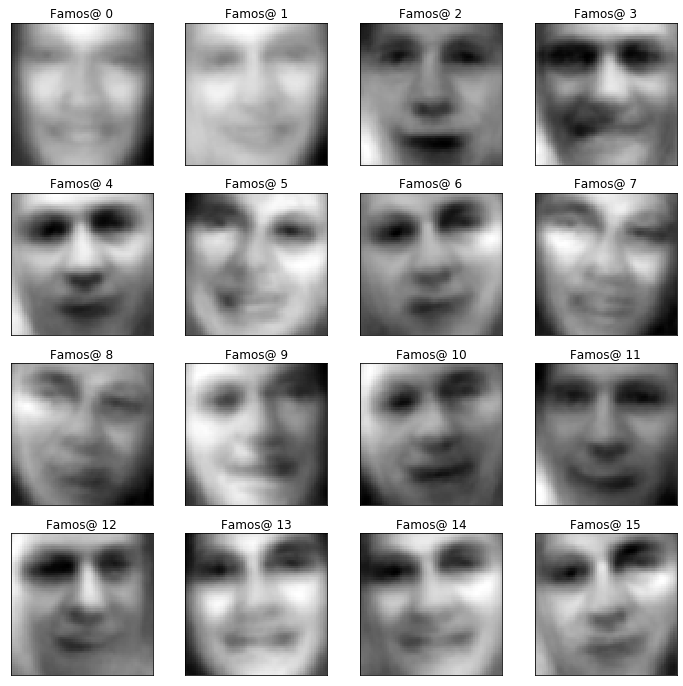

In [10]:
#Procedemos a reconstruir con los ultimos valores calculados, que corresponden a considerar
#solo 10 componentes (10 eigenfaces). Este calculo se hace para todas las imagenes.
#Pero solo se muestran 16, que son las mismas 16 que se mostraron en la cuarta celda
imagenesReconstruidas=[reconstruye(phi, componentes, psi, imagenes.shape[1], imagenes.shape[2], contador) for contador in range(len(imagenes))]
imagenesReconstruidas = np.array(imagenesReconstruidas)
muestraImagenes(imagenesReconstruidas[z], imagenes.shape[1], imagenes.shape[2], 4, 4)

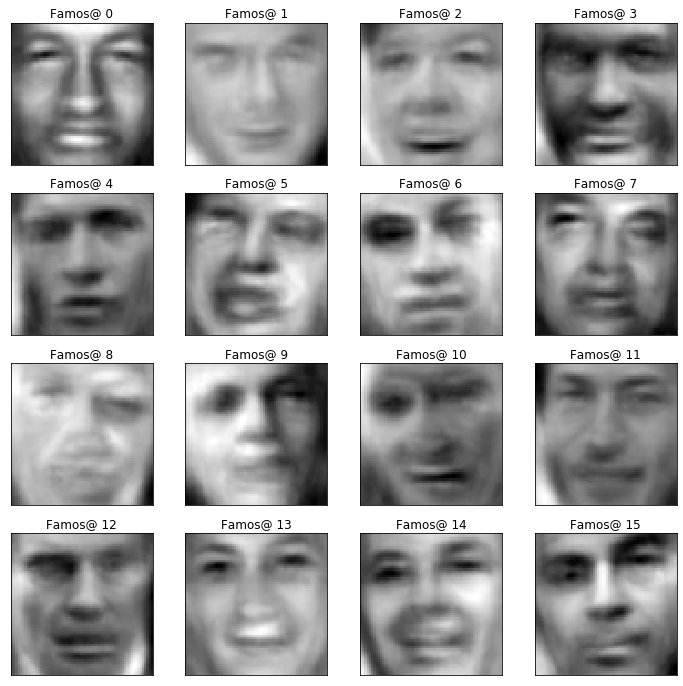

In [11]:
#hagamos de nuevo pero con 50 eigenfaces, dado que reescribimos las variables es necesario volver a
#calcular las eigenfaces.Analogamente mostramos las mismas 16 imagenes de la celda 4 pero reconstruidas
#a partir de nuestras eigenfaces.
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=50)
eigenFaces = componentes.reshape((50, imagenes.shape[1],imagenes.shape[2]))
imagenesReconstruidas=[reconstruye(phi, componentes, psi, imagenes.shape[1], imagenes.shape[2], contador) for contador in range(len(imagenes))]
imagenesReconstruidas = np.array(imagenesReconstruidas)
muestraImagenes(imagenesReconstruidas[z], imagenes.shape[1], imagenes.shape[2], 4, 4)

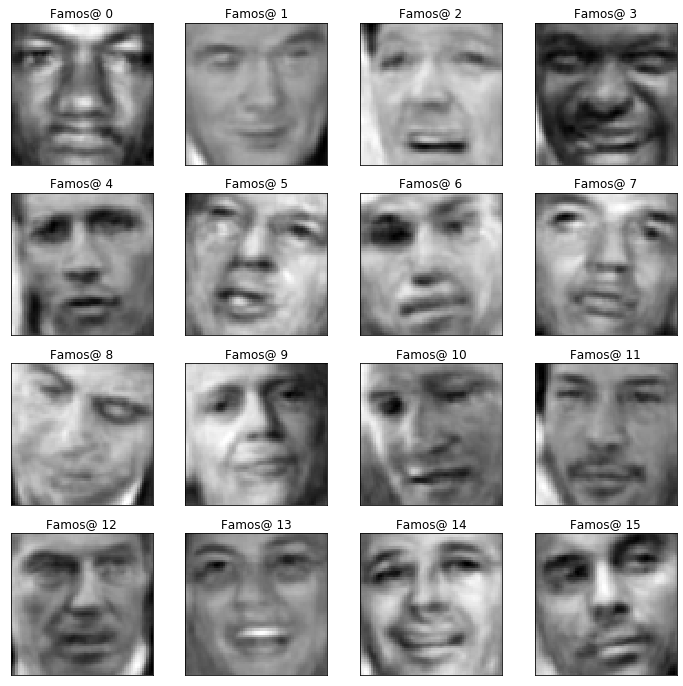

In [12]:
#hagamos de nuevo pero con 150 eigenfaces, dado que reescribimos las variables es necesario volver a
#calcular las eigenfaces.Analogamente mostramos las mismas 16 imagenes de la celda 4 pero reconstruidas
#a partir de nuestras eigenfaces.
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=150)
eigenFaces = componentes.reshape((150, imagenes.shape[1],imagenes.shape[2]))
imagenesReconstruidas=[reconstruye(phi, componentes, psi, imagenes.shape[1], imagenes.shape[2], contador) for contador in range(len(imagenes))]
imagenesReconstruidas = np.array(imagenesReconstruidas)
muestraImagenes(imagenesReconstruidas[z], imagenes.shape[1], imagenes.shape[2], 4, 4)

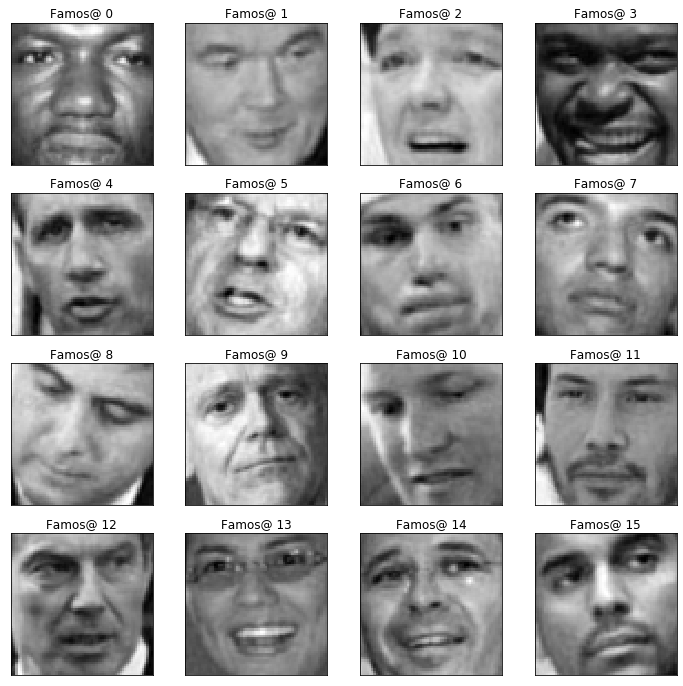

In [13]:
#hagamos de nuevo pero con 450 eigenfaces, dado que reescribimos las variables es necesario volver a
#calcular las eigenfaces.Analogamente mostramos las mismas 16 imagenes de la celda 4 pero reconstruidas
#a partir de nuestras eigenfaces.
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=450)
eigenFaces = componentes.reshape((450, imagenes.shape[1],imagenes.shape[2]))
imagenesReconstruidas=[reconstruye(phi, componentes, psi, imagenes.shape[1], imagenes.shape[2], contador) for contador in range(len(imagenes))]
imagenesReconstruidas = np.array(imagenesReconstruidas)
muestraImagenes(imagenesReconstruidas[z], imagenes.shape[1], imagenes.shape[2], 4, 4)

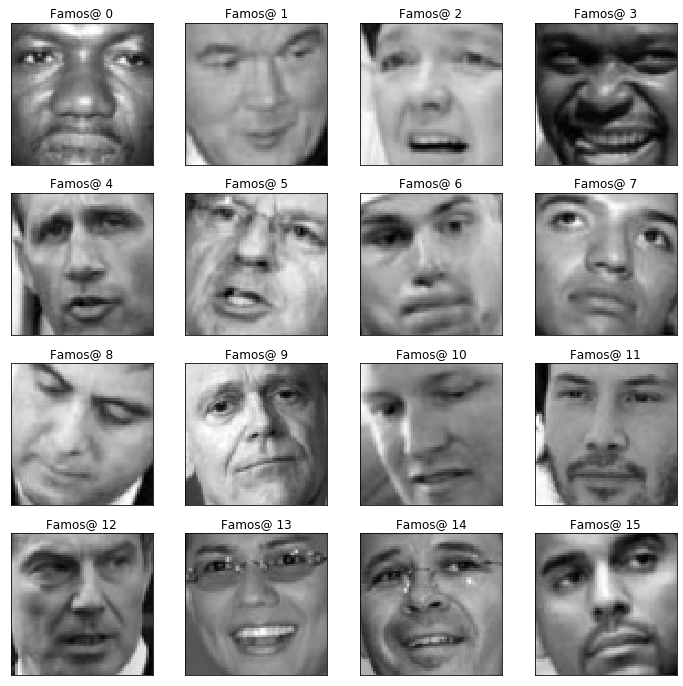

In [14]:
#hagamos de nuevo pero con todas las eigenfaces, dado que reescribimos las variables es necesario volver a
#calcular las eigenfaces.Analogamente mostramos las mismas 16 imagenes de la celda 4 pero reconstruidas
#a partir de nuestras eigenfaces.
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=1071)
eigenFaces = componentes.reshape((1071, imagenes.shape[1],imagenes.shape[2]))
imagenesReconstruidas=[reconstruye(phi, componentes, psi, imagenes.shape[1], imagenes.shape[2], contador) for contador in range(len(imagenes))]
imagenesReconstruidas = np.array(imagenesReconstruidas)
muestraImagenes(imagenesReconstruidas[z], imagenes.shape[1], imagenes.shape[2], 4, 4)

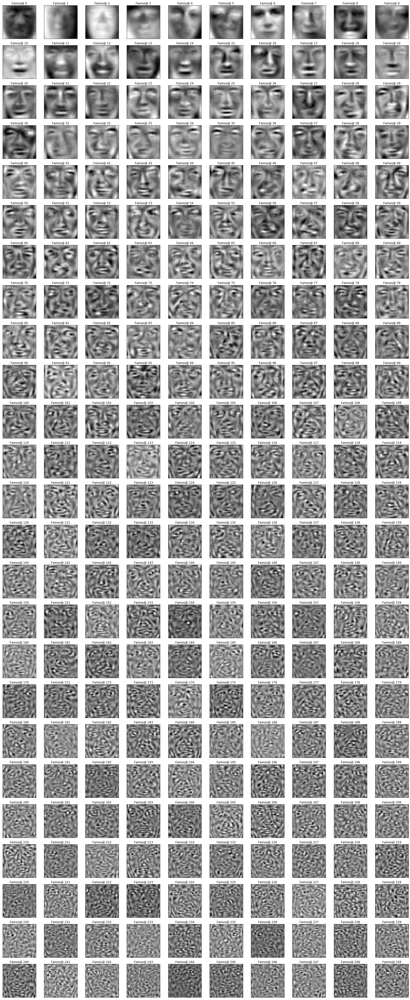

In [15]:
#mostramos las primeras 250 eigenFaces
muestraImagenes(eigenFaces, 64, 64, 25, 10) 

In [16]:
#ahoravamos a reconstruir 4 gatos y 2 perros (doge y cheems)
#leemos las imagenes en una lista
gatosPerros = [cv2.imread(file,0) for file in glob.glob("cats/*.jpg")]
#pasamos la lista a un numpy array
gatosPerros = np.array(gatosPerros)
#mostramos el shape del array
gatosPerros.shape

(6, 64, 64)

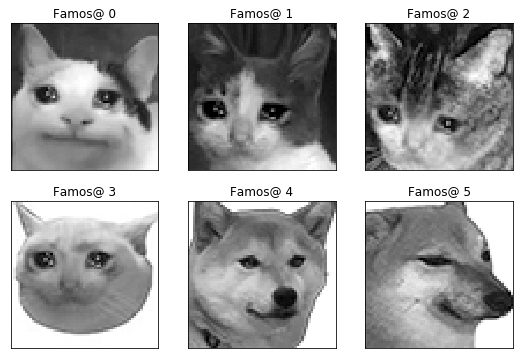

In [17]:
#mostramos las imagenes (memes xD)
muestraImagenes(gatosPerros,gatosPerros.shape[1],gatosPerros.shape[2],2,3)

In [18]:
#dado que estamos cambiando las imagenes a reconstruir, es necesario
#hacer un reshape de los memes (N^2 X 1) y calcular su phi, esto
#para pasarle el vector phi a la funcion reconstruye
#note que los eigenvectores calculados para las eigenfaces no cambian
GammaGato = gatosPerros.reshape(gatosPerros.shape[0],gatosPerros.shape[1]*gatosPerros.shape[2])
phiGato = GammaGato-psi 

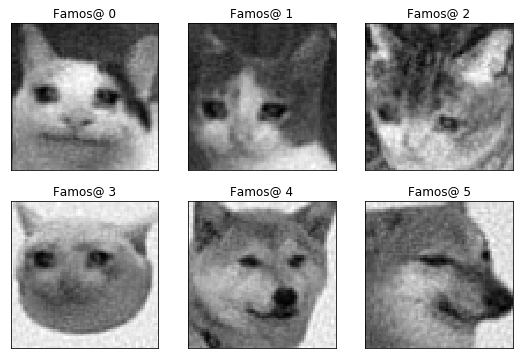

In [19]:
#reconstruimos los memes con los ultimos eigenfaces calculados (1071: todos)
imagenesReconstruidasGatosPerros=[reconstruye(phiGato, componentes, psi, gatosPerros.shape[1], gatosPerros.shape[2], contador) for contador in range(len(gatosPerros))]
imagenesReconstruidasGatosPerros = np.array(imagenesReconstruidasGatosPerros)
muestraImagenes(imagenesReconstruidasGatosPerros, gatosPerros.shape[1], gatosPerros.shape[2], 2, 3)

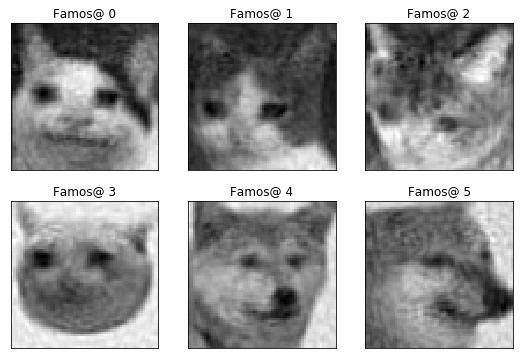

In [20]:
#hagamos de nuevo pero con 450 eigenfaces, dado que reescribimos las variables es necesario volver a
#calcular las eigenfaces.
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=450)
#reconstruimos los memes con los ultimos eigenfaces calculados (450)
phiGato = GammaGato-psi
imagenesReconstruidasGatosPerros=[reconstruye(phiGato, componentes, psi, gatosPerros.shape[1], gatosPerros.shape[2], contador) for contador in range(len(gatosPerros))]
imagenesReconstruidasGatosPerros = np.array(imagenesReconstruidasGatosPerros)
muestraImagenes(imagenesReconstruidasGatosPerros, gatosPerros.shape[1], gatosPerros.shape[2], 2, 3)

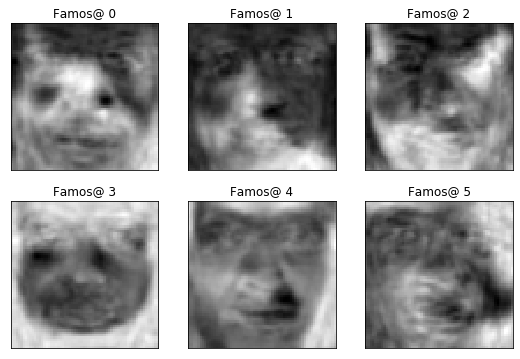

In [21]:
#hagamos de nuevo pero con 150 eigenfaces, dado que reescribimos las variables es necesario volver a
#calcular las eigenfaces
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=150)
#reconstruimos los memes con los ultimos eigenfaces calculados (150)
phiGato = GammaGato-psi
imagenesReconstruidasGatosPerros=[reconstruye(phiGato, componentes, psi, gatosPerros.shape[1], gatosPerros.shape[2], contador) for contador in range(len(gatosPerros))]
imagenesReconstruidasGatosPerros = np.array(imagenesReconstruidasGatosPerros)
muestraImagenes(imagenesReconstruidasGatosPerros, gatosPerros.shape[1], gatosPerros.shape[2], 2, 3)

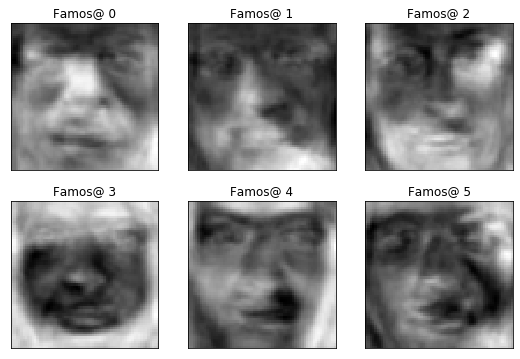

In [22]:
#hagamos de nuevo pero con 80 eigenfaces, dado que reescribimos las variables es necesario volver a
#calcular las eigenfaces
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=80)
#reconstruimos los memes con los ultimos eigenfaces calculados (80)
phiGato = GammaGato-psi
imagenesReconstruidasGatosPerros=[reconstruye(phiGato, componentes, psi, gatosPerros.shape[1], gatosPerros.shape[2], contador) for contador in range(len(gatosPerros))]
imagenesReconstruidasGatosPerros = np.array(imagenesReconstruidasGatosPerros)
muestraImagenes(imagenesReconstruidasGatosPerros, gatosPerros.shape[1], gatosPerros.shape[2], 2, 3)

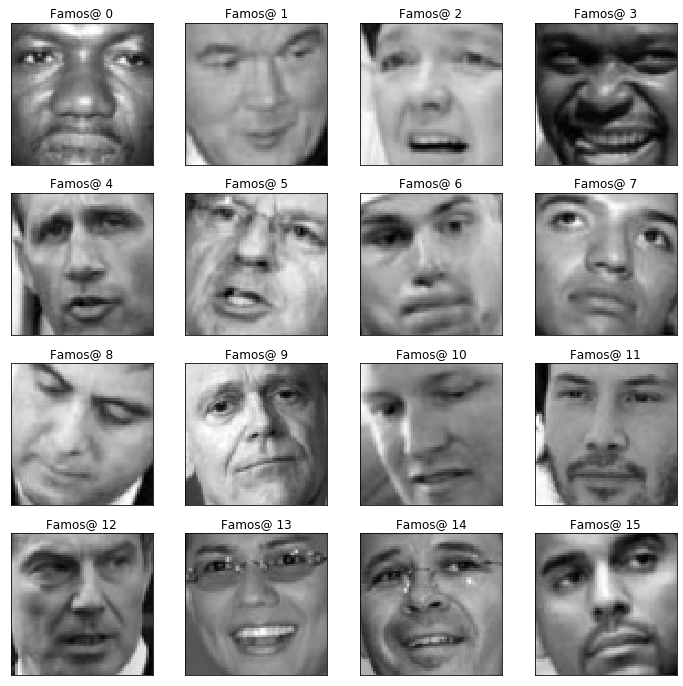

In [23]:
#hagamos de nuevo pero con todas las eigenfaces, dado que reescribimos las variables es necesario volver a
#calcular las eigenfaces.Analogamente mostramos las mismas 16 imagenes de la celda 4 pero reconstruidas
#a partir de nuestras eigenfaces.
proyeccion, componentes, psi, phi= PCA(imagenes, numcomponentes=1071)
eigenFaces = componentes.reshape((1071, imagenes.shape[1],imagenes.shape[2]))
imagenesReconstruidas=[reconstruye(phi, componentes, psi, imagenes.shape[1], imagenes.shape[2], contador) for contador in range(len(imagenes))]
imagenesReconstruidas = np.array(imagenesReconstruidas)
muestraImagenes(imagenesReconstruidas[z], imagenes.shape[1], imagenes.shape[2], 4, 4)

In [24]:
#definimos nusetra funcion de error que simplemente es la norma l2
# del vector reconstruido con el vecto imagen (de tamano N X 1)
# esta distancia se calcula para una iteracion dada con k eigenvectores dados
#en cada iteracion se aumenta la cantidad de los k eigenvectores
def lossy(imagen,phi,componentes,psi,imagenPromedio):
    lista = []
    loss = []
    salto = []
    imagenPromedio = imagenPromedio.reshape(imagenPromedio.shape[0]*imagenPromedio.shape[1])
    imagen = imagen.reshape(imagen.shape[0]*imagen.shape[1])
    centro = imagen-psi
    for j in range(0,componentes.shape[0]):
        lista.append(componentes[j].T@centro)
    pesos = np.array(lista)
    
    for i in range(0,1072,3):
        reconstruccion = imagenPromedio + componentes[:i].T@pesos[:i]
        err = imagen - reconstruccion
        err = err.T @ err
        loss.append(err)
        salto.append(i+1)
        
    lossys = np.array(loss)
    lossys = np.sqrt(lossys)
    lossys = np.column_stack((salto, lossys))
    return lossys

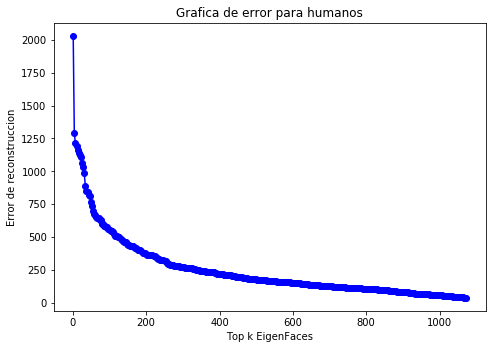

In [25]:
#obtenemos nuestra grafica del error al variar los keigenvectores dados
errors = lossy(imagenes[45],phi,componentes,psi,caraPromedio)
fig=plt.figure()
ax=fig.add_axes([0,0,1,1])
ax.plot(errors[:,0],errors[:,1], '-o',color='b')
ax.set_xlabel('Top k EigenFaces')
ax.set_ylabel('Error de reconstruccion')
ax.set_title('Grafica de error para humanos')
plt.show()

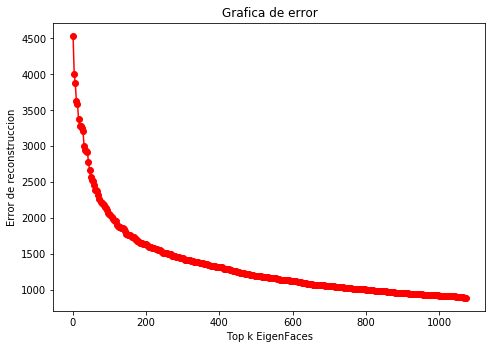

In [26]:
#calculemos lo mismo pero para los gatos
GammaGato = gatosPerros.reshape(gatosPerros.shape[0],gatosPerros.shape[1]*gatosPerros.shape[2])
phiGato = GammaGato-psi 
errorsGato = lossy(gatosPerros[5],phiGato,componentes,psi,caraPromedio)
fig=plt.figure()
ax=fig.add_axes([0,0,1,1])
ax.plot(errorsGato[:,0],errorsGato[:,1], '-o',color='r')
ax.set_xlabel('Top k EigenFaces')
ax.set_ylabel('Error de reconstruccion')
ax.set_title('Grafica de error')
plt.show()

In [27]:
#imprimimos mensajes utiles
print("El error minimo para una cara humana es de %.2f , mientras que para Cheems es de %.2f" %(errors[357,1],errorsGato[357,1]))
print("Considerando que hay regularidad en los datos tanto de perro y humanos podemos decir que la cara humana tendra un error no mayor a 100 unidades")
#print('puesm buscamle! ggggg')

El error minimo para una cara humana es de 36.65 , mientras que para Cheems es de 889.36
Considerando que hay regularidad en los datos tanto de perro y humanos podemos decir que la cara humana tendra un error no mayor a 100 unidades


In [28]:
#definimos nusetra funcion de error que simplemente es la norma l2
# del vector reconstruido con el vector imagen (de tamano N X 1)
# esta distancia se calcula para los 1071 eigenvectores
def lossy1(imagen,phi,componentes,psi,imagenPromedio):
    lista = []
    imagenPromedio = imagenPromedio.reshape(imagenPromedio.shape[0]*imagenPromedio.shape[1])
    imagen = imagen.reshape(imagen.shape[0]*imagen.shape[1])
    centro = imagen-psi
    for j in range(0,componentes.shape[0]):
        lista.append(componentes[j].T@centro)
    pesos = np.array(lista)
    reconstruccion = componentes.T@pesos
    err = imagenPromedio - reconstruccion
    reconstruccion = reconstruccion.reshape((64,64))
    err = err.T @ err
    err = np.sqrt(err)
    return err

In [29]:
#definimos nusetra funcion de error que simplemente es la norma l2
# del vector reconstruido con el vector imagen (de tamano N X 1)
# esta distancia se calcula para los 1071 eigenvectores
def lossy2(imagen,phi,componentes,psi,imagenPromedio):
    lista = []
    imagenPromedio = imagenPromedio.reshape(imagenPromedio.shape[0]*imagenPromedio.shape[1])
    imagen = imagen.reshape(imagen.shape[0]*imagen.shape[1])
    centro = imagen-psi
    for j in range(0,componentes.shape[0]):
        lista.append(componentes[j].T@centro)
    pesos = np.array(lista)
    reconstruccion = componentes.T@pesos
    err = centro - reconstruccion
    err = err.T @ err
    err = np.sqrt(err)
    return err

## Reconocimiento de caras

Ya entrenamos y tenemos los parametros (hasta el ultimo entrenamiento de personas) para todas las componentes o eigenfaces.
Basta con recorrer una ventana de tamano 64 x 64 a una imagen a la cual queremos detectar rostros. para cada ventana se obtendra el error tal y como se realizo anteriormente y se verificara su valor. Si este valor es mayor a 100, entonces no es una cara. si es menor o igual entonces si lo es y pintaremos el recuadro de la ventana de un color especial.

### Esta hipotesis es invalida, al menos para imagenes cuya resolucion es diferente al dataset de entrenamiento

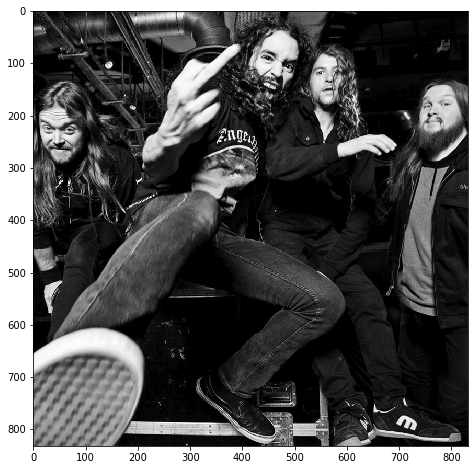

In [30]:
#leemos la imagen y la mostramos
bandaDeMetal = cv2.imread('havok1.jpg',0)
plt.figure(figsize = (8,8))
plt.imshow(bandaDeMetal,cmap='gray')
plt.show()

## El gesto NO representa nada en particular y NO señala a nadie en particular

In [31]:
#imprimimos sus dimensiones
print(bandaDeMetal.shape)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,bandaDeMetal.shape[0]+1,64):
    for columnas in range(32,bandaDeMetal.shape[1]+1,64):
        ventana = bandaDeMetal[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy1(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 11500):
            bandaDeMetal[filas-31,columnas-31:columnas+31]=255
            bandaDeMetal[filas+31,columnas-31:columnas+31]=255
            bandaDeMetal[filas-31:filas+31,columnas-31]=255
            bandaDeMetal[filas-31:filas+31,columnas+31]=255

(832, 832)


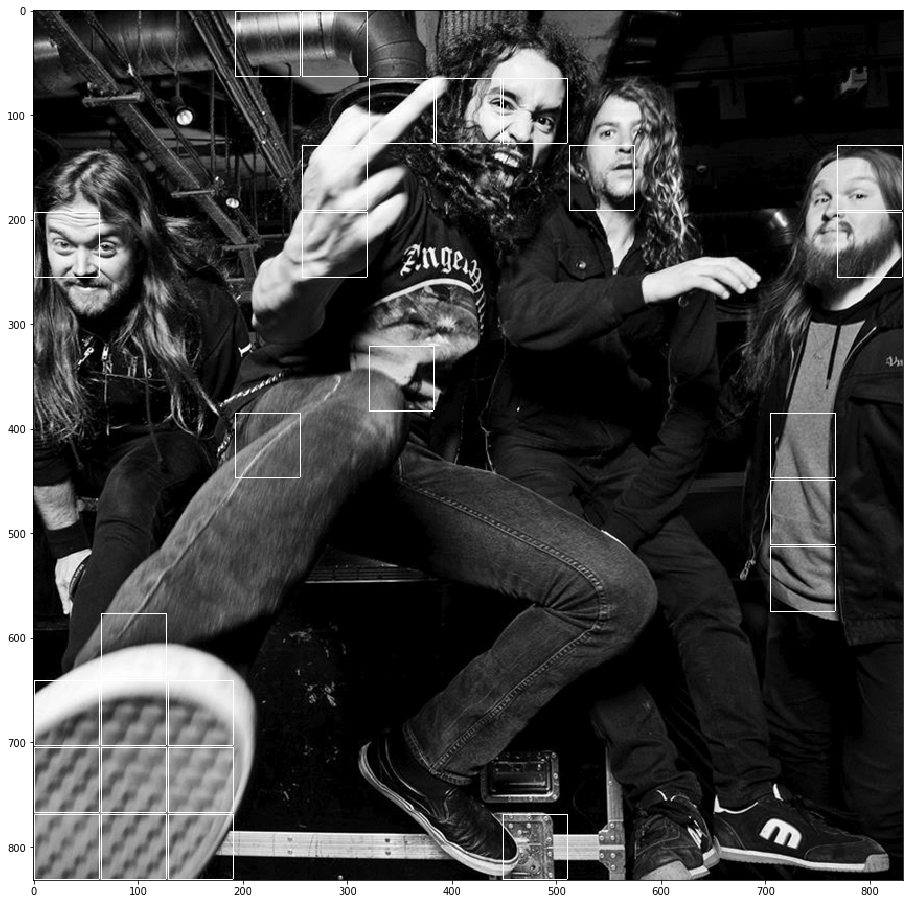

In [32]:
plt.figure(figsize = (16,16))
plt.imshow(bandaDeMetal,cmap='gray')
plt.show()

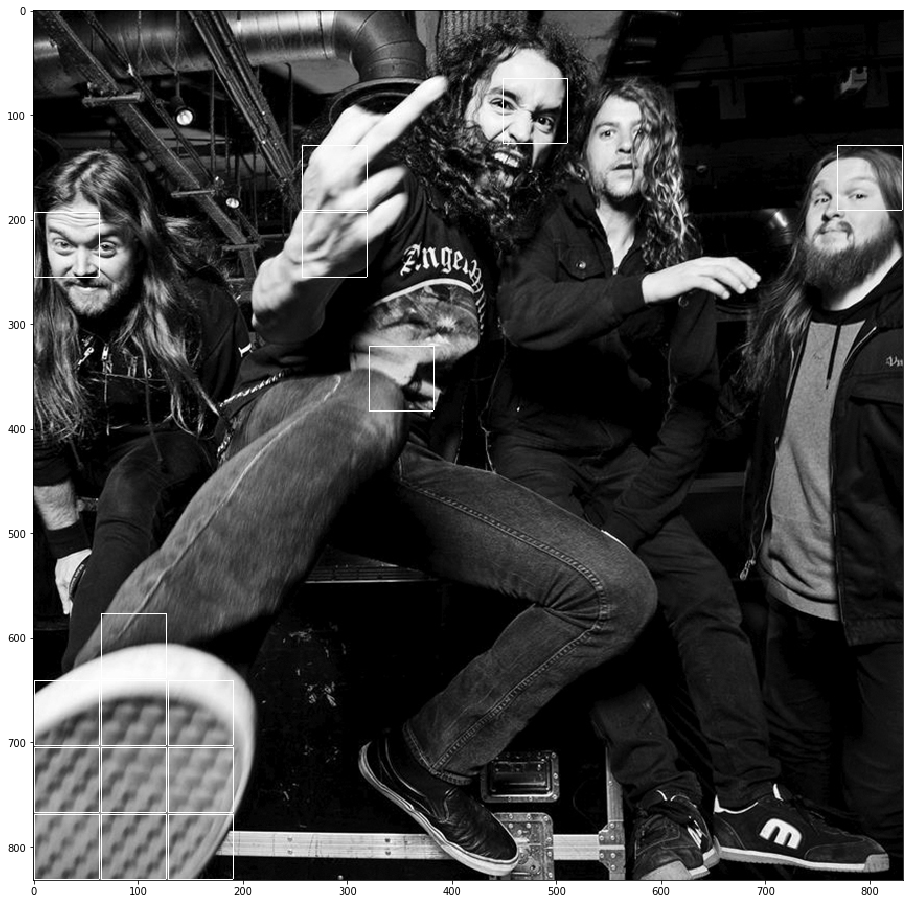

True

In [33]:
#guardamos la imagen
cv2.imwrite('havokError11500.png',bandaDeMetal)
#ahoravamos a cambiar el threshold para comparar
bandaDeMetal = cv2.imread('havok1.jpg',0)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,bandaDeMetal.shape[0]+1,64):
    for columnas in range(32,bandaDeMetal.shape[1]+1,64):
        ventana = bandaDeMetal[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy1(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 10000):
            bandaDeMetal[filas-31,columnas-31:columnas+31]=255
            bandaDeMetal[filas+31,columnas-31:columnas+31]=255
            bandaDeMetal[filas-31:filas+31,columnas-31]=255
            bandaDeMetal[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(bandaDeMetal,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('havokError10000.png',bandaDeMetal)

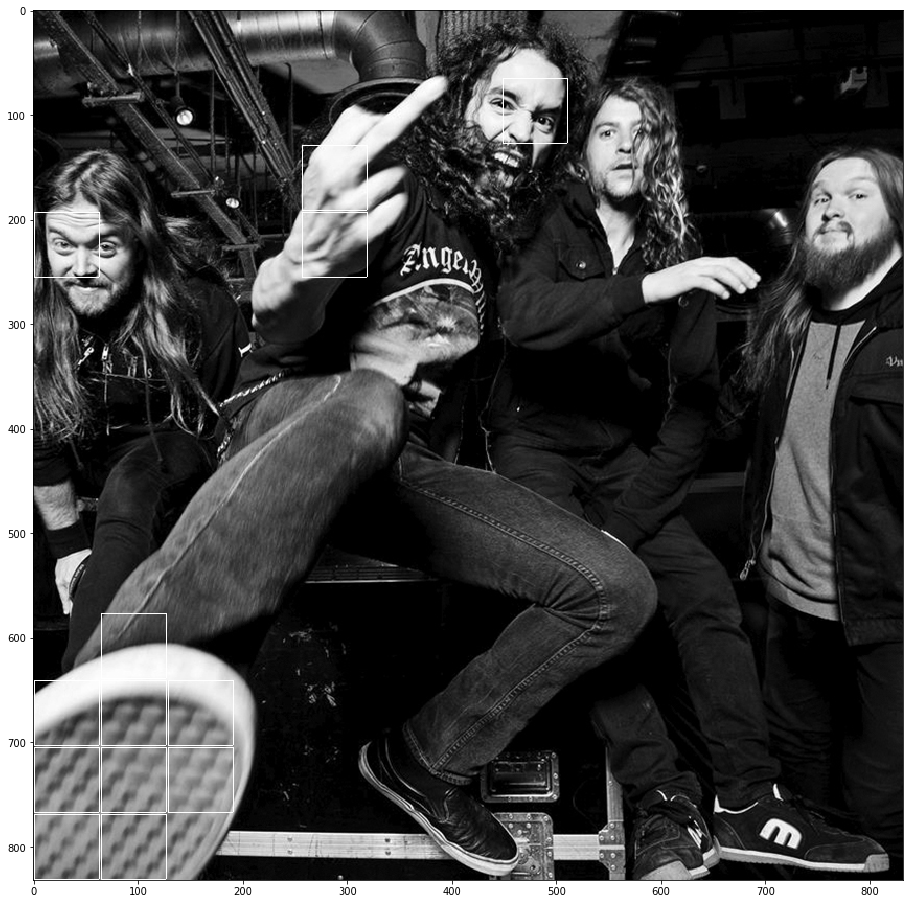

True

In [34]:
bandaDeMetal = cv2.imread('havok1.jpg',0)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,bandaDeMetal.shape[0]+1,64):
    for columnas in range(32,bandaDeMetal.shape[1]+1,64):
        ventana = bandaDeMetal[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy1(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 9500):
            bandaDeMetal[filas-31,columnas-31:columnas+31]=255
            bandaDeMetal[filas+31,columnas-31:columnas+31]=255
            bandaDeMetal[filas-31:filas+31,columnas-31]=255
            bandaDeMetal[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(bandaDeMetal,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('havokError9500.png',bandaDeMetal)

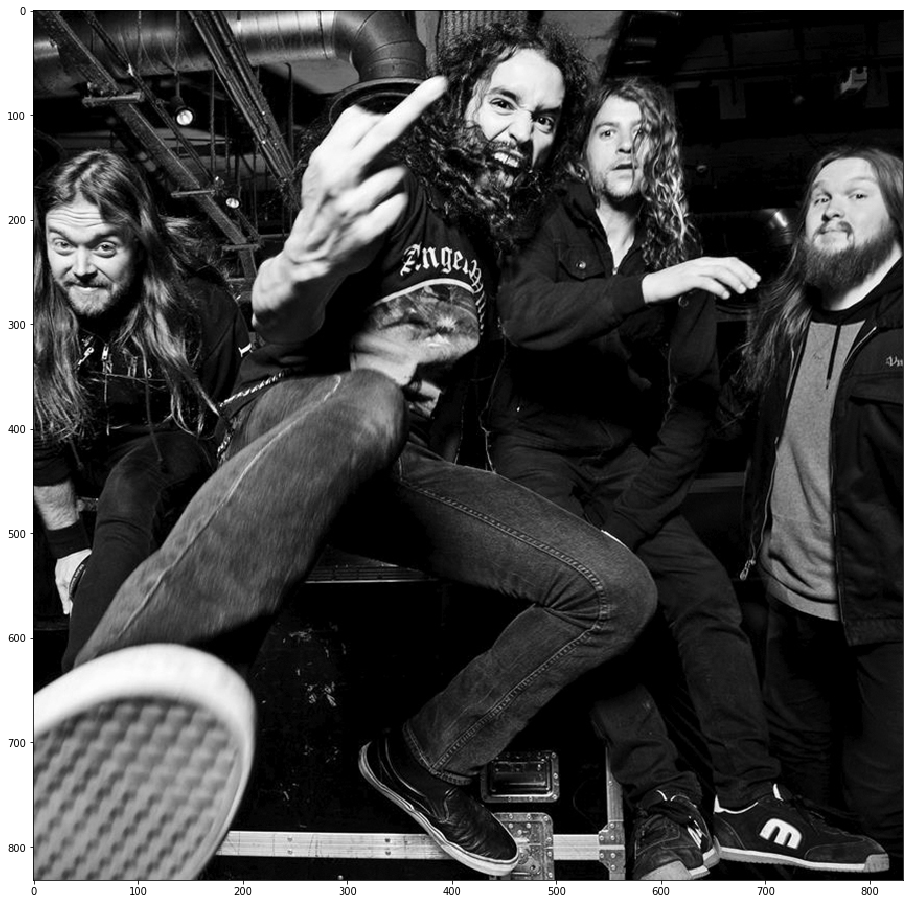

True

In [35]:
bandaDeMetal = cv2.imread('havok1.jpg',0)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,bandaDeMetal.shape[0]+1,64):
    for columnas in range(32,bandaDeMetal.shape[1]+1,64):
        ventana = bandaDeMetal[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy1(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 1500):
            bandaDeMetal[filas-31,columnas-31:columnas+31]=255
            bandaDeMetal[filas+31,columnas-31:columnas+31]=255
            bandaDeMetal[filas-31:filas+31,columnas-31]=255
            bandaDeMetal[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(bandaDeMetal,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('havokError1500.png',bandaDeMetal)

(576, 576)


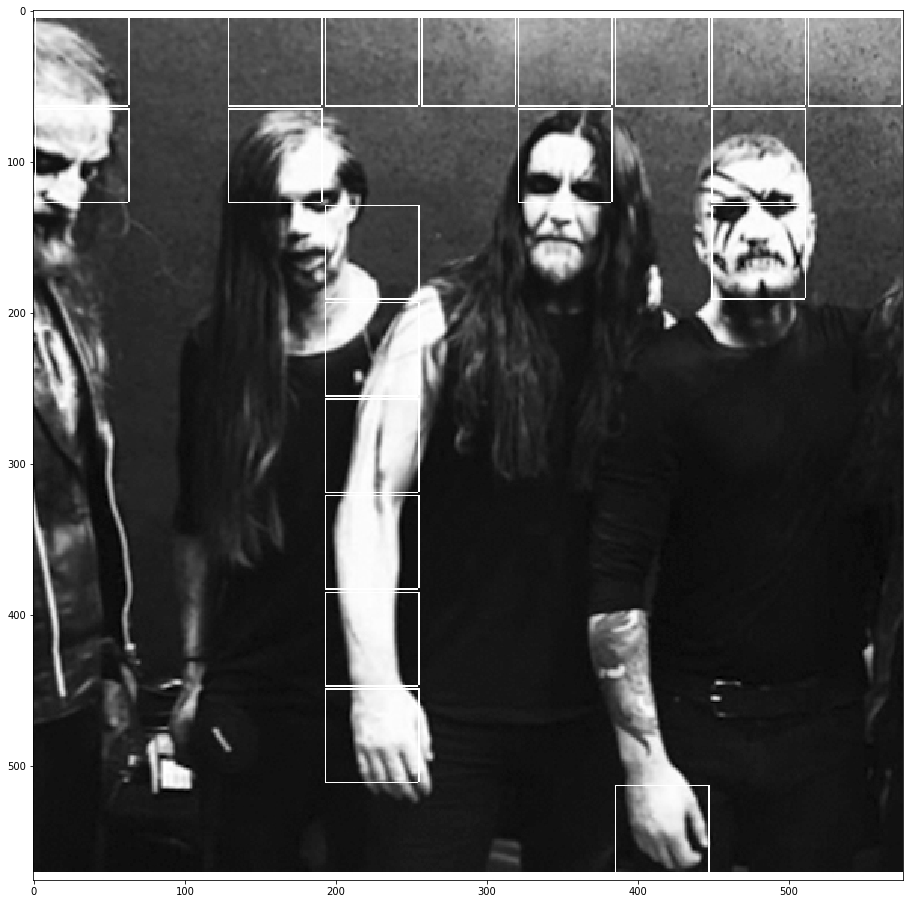

True

In [36]:
#ahora probemos con otra imagen de black
black = cv2.imread('gaal.jpg',0)
#imprimimos sus dimensiones
print(black.shape)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,black.shape[0]+1,64):
    for columnas in range(32,black.shape[1]+1,64):
        ventana = black[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy1(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 11000):
            black[filas-31,columnas-31:columnas+31]=255
            black[filas+31,columnas-31:columnas+31]=255
            black[filas-31:filas+31,columnas-31]=255
            black[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(black,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('black11000.png',black)

(576, 576)


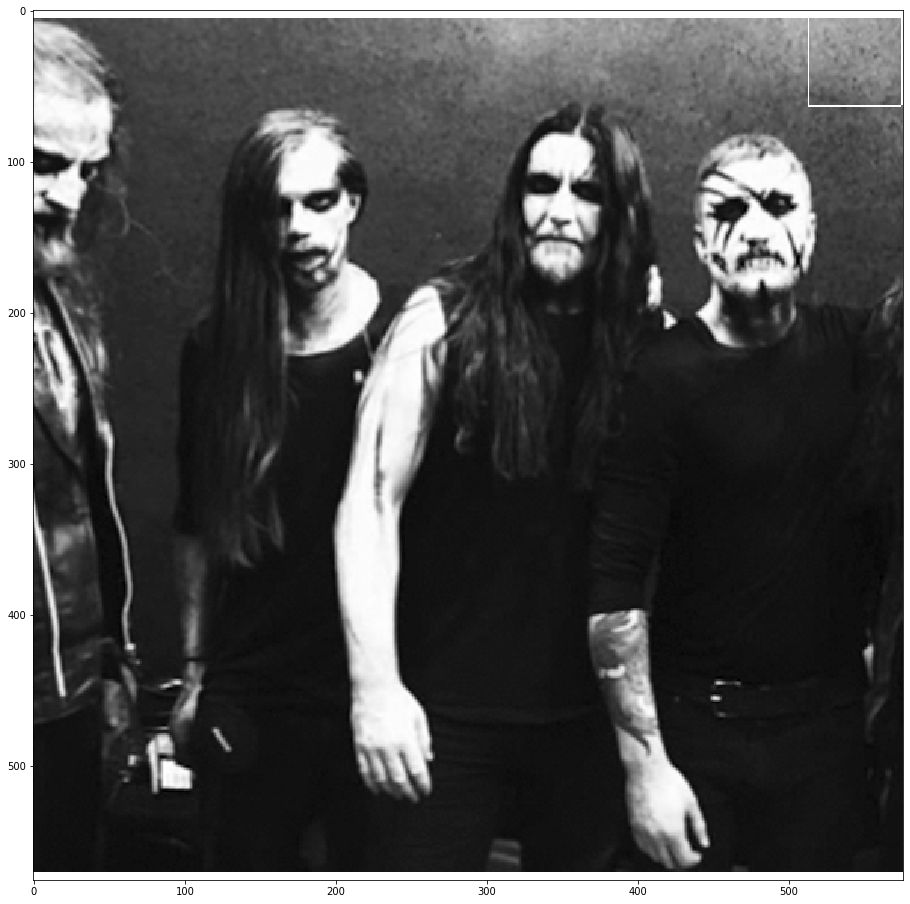

True

In [37]:
#ahora probemos con otra imagen de black
black = cv2.imread('gaal.jpg',0)
#imprimimos sus dimensiones
print(black.shape)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,black.shape[0]+1,64):
    for columnas in range(32,black.shape[1]+1,64):
        ventana = black[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy1(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 8000):
            black[filas-31,columnas-31:columnas+31]=255
            black[filas+31,columnas-31:columnas+31]=255
            black[filas-31:filas+31,columnas-31]=255
            black[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(black,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('black8000.png',black)

(576, 576)


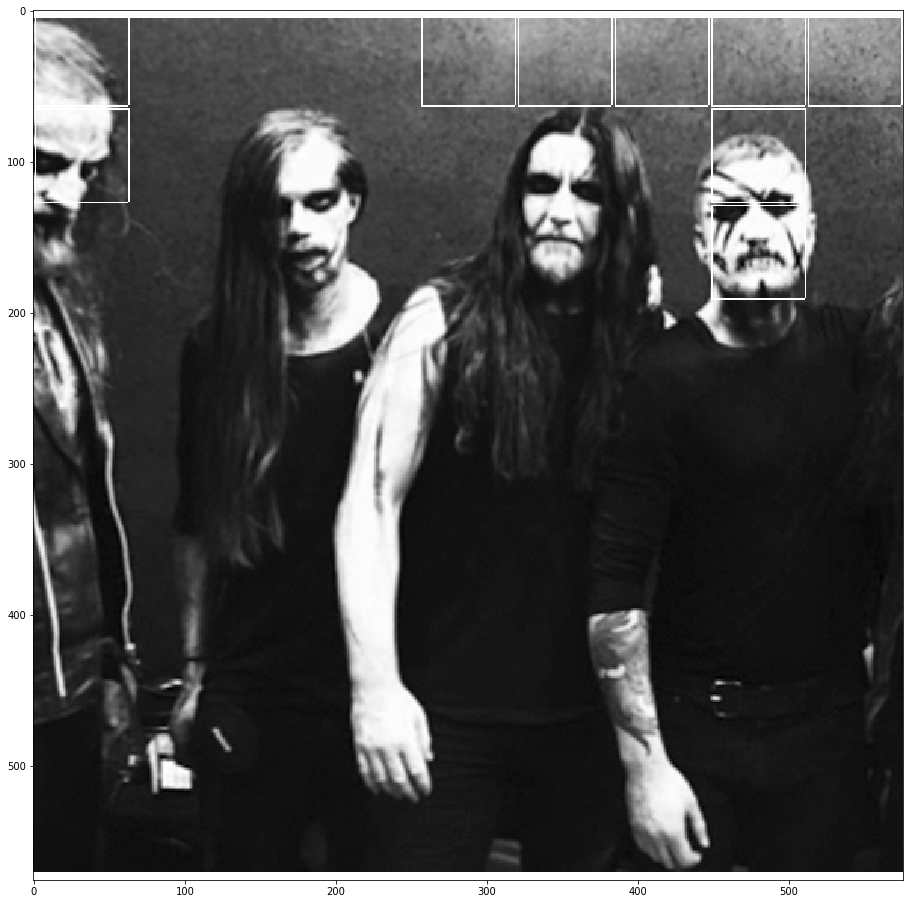

True

In [38]:
#ahora probemos con otra imagen de black
black = cv2.imread('gaal.jpg',0)
#imprimimos sus dimensiones
print(black.shape)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,black.shape[0]+1,64):
    for columnas in range(32,black.shape[1]+1,64):
        ventana = black[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy1(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 9000):
            black[filas-31,columnas-31:columnas+31]=255
            black[filas+31,columnas-31:columnas+31]=255
            black[filas-31:filas+31,columnas-31]=255
            black[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(black,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('black9000.png',black)

(576, 576)


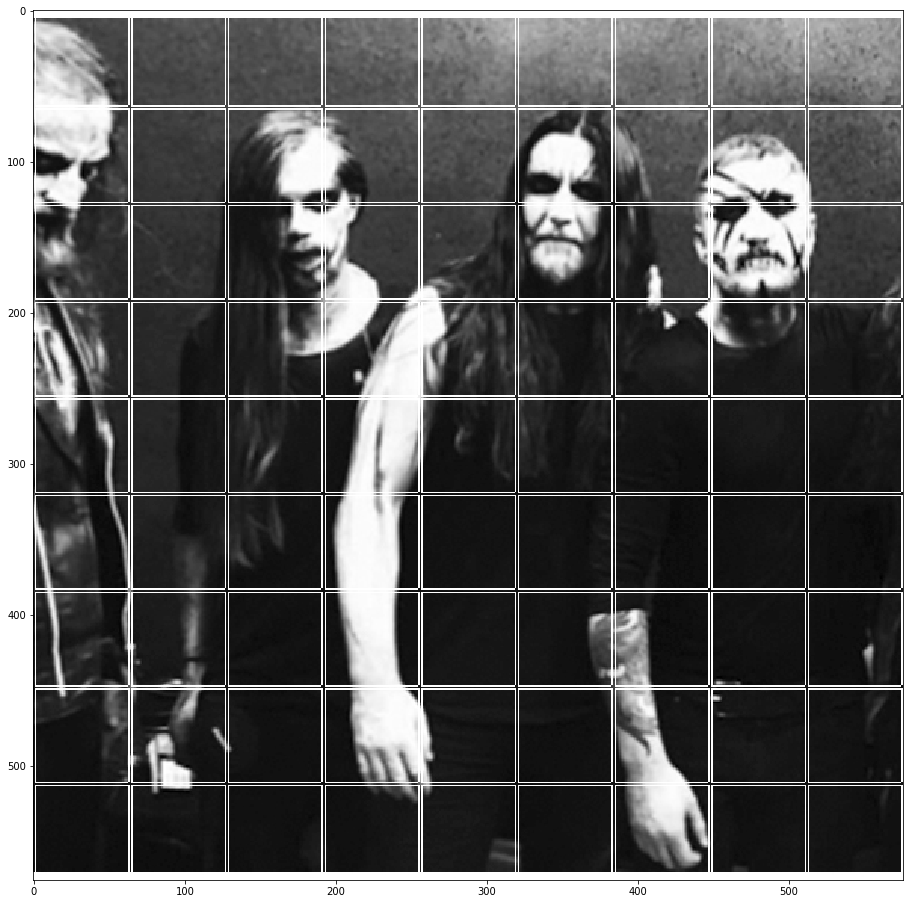

True

In [39]:
#ahora probemos con otra imagen de black
black = cv2.imread('gaal.jpg',0)
#imprimimos sus dimensiones
print(black.shape)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,black.shape[0]+1,64):
    for columnas in range(32,black.shape[1]+1,64):
        ventana = black[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy2(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 8000):
            black[filas-31,columnas-31:columnas+31]=255
            black[filas+31,columnas-31:columnas+31]=255
            black[filas-31:filas+31,columnas-31]=255
            black[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(black,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('black8000Usual.png',black)

(576, 576)


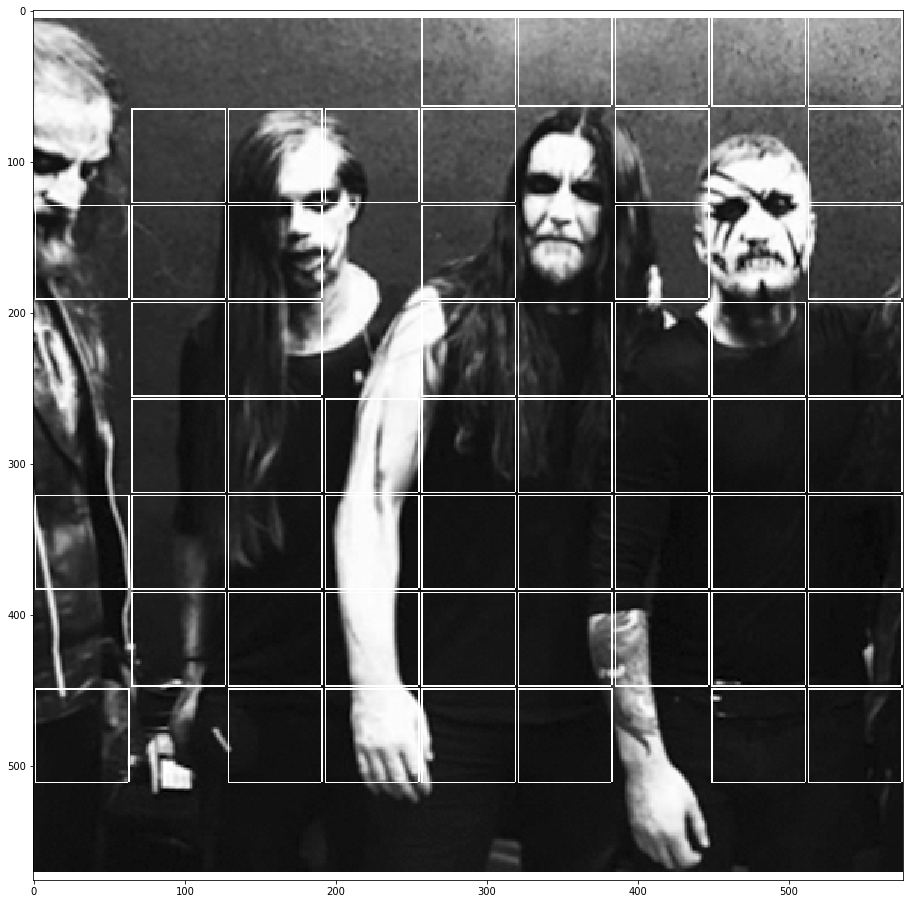

True

In [40]:
#ahora probemos con otra imagen de black
black = cv2.imread('gaal.jpg',0)
#imprimimos sus dimensiones
print(black.shape)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,black.shape[0]+1,64):
    for columnas in range(32,black.shape[1]+1,64):
        ventana = black[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy2(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 400):
            black[filas-31,columnas-31:columnas+31]=255
            black[filas+31,columnas-31:columnas+31]=255
            black[filas-31:filas+31,columnas-31]=255
            black[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(black,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('black400Usual.png',black)

(576, 576)


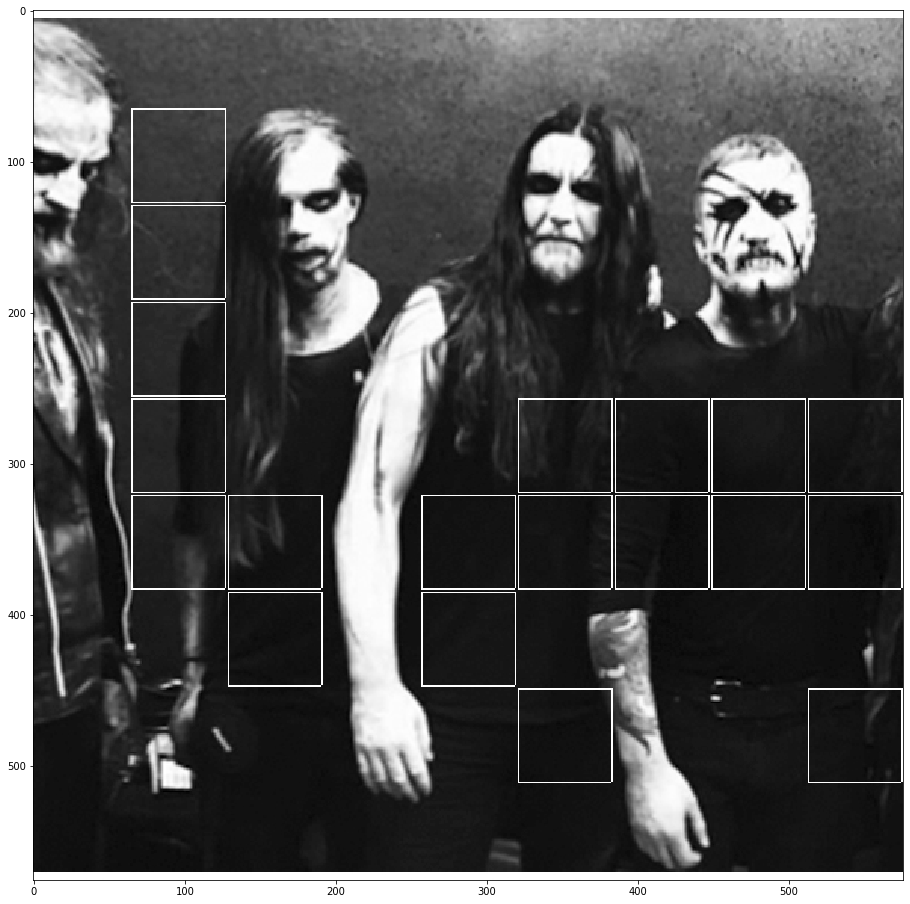

True

In [41]:
#ahora probemos con otra imagen de black
black = cv2.imread('gaal.jpg',0)
#imprimimos sus dimensiones
print(black.shape)
#creamos los ciclos for para iterar sobre la imagen y pintar la imagen si se detecta una cara
for filas in range(32,black.shape[0]+1,64):
    for columnas in range(32,black.shape[1]+1,64):
        ventana = black[filas-32:filas+32,columnas-32:columnas+32]
        error = lossy2(ventana,phi,componentes,psi,caraPromedio)
        if (error <= 100):
            black[filas-31,columnas-31:columnas+31]=255
            black[filas+31,columnas-31:columnas+31]=255
            black[filas-31:filas+31,columnas-31]=255
            black[filas-31:filas+31,columnas+31]=255

plt.figure(figsize = (16,16))
plt.imshow(black,cmap='gray')
plt.show()
#guardamos la imagen
cv2.imwrite('black100Usual.png',black)